<!--
Software Name : learning-parities-with-product-networks
SPDX-FileCopyrightText: Copyright (c) 2026 Orange S.A.
SPDX-License-Identifier: MIT

This software is distributed under the MIT License .,
see the "LICENSE.md" file for more details or https://opensource.org/licenses/MIT

Author: Guillaume Larue, guillaume.larue@orange.com
Software description: Source code of the paper "Learning High-Dimensional Parity Functions with Product Networks"
-->

# Study F — Weight Distribution Dynamics During Training

Tracks how the model weight distribution evolves over training steps, separated by their target oracle weights (oracle = 0 or 1). Validates the Gaussian approximation described in Section 4.2 .

**Data generated by:** [run_study_F.py](../studies/run_study_F.py)  
**Paper section:** 
- Section 5.2.1 — Validation of the Gaussian Model (Figure 2)
- Appendix G.1 - Oracle Weight Proportion Independence Validation (Figure 14)
- Appendix G.2 - Detailed Distributional Analysis Across Oracle Weight Proportions (Figures 15-21)

| Parameter | Value |
|-----------|-------|
| Problem Size $N$          | 100000           |
| Num. Parallel Nodes $P$   | 1          |
| Learning Rate $\alpha$    | 10           |
| Batch Size $M$            | 1000           |
| Bernouilli Prob. $p_e$    | $1/N$  |
| Max. Steps $S$            | 1000000         | 
| Oracle Proportion $p_w$   | {0.0, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0}          |

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sys
import os
import glob

from matplotlib.lines import Line2D


# Add parent directory to path
sys.path.append('..')

from plotting.plot_utility import setup_plot_style, plot_distribution_analysis

%matplotlib inline
setup_plot_style()

In [2]:
def get_latest_study_folder(study_prefix):
    pattern = f'../studies/results/{study_prefix}_*/'
    folders = glob.glob(pattern)
    if folders:
        return max(folders)  # Latest by name (timestamp-based)
    return None

mode = 'auto'  # Change to 'manual' to specify your own path

if mode == 'auto':
    results_dir = get_latest_study_folder('F_weight_distribution')
    if results_dir is None:
        raise FileNotFoundError("No Study F results found. Run run_study_F.py first.")
    print(f"Auto-detected folder: {results_dir}")
else:
    results_dir = '../studies/results/F_weight_distribution_XXXXXX_XXXXXX/'
    print(f"Using manual path: {results_dir}")

# Load data for fixed p_w = 0.5
p_w = 0.5
weight_stats = np.load(f'{results_dir}p_w_{p_w:.2f}/weight_stats.npy', allow_pickle=True).item()
oracle_weights = np.load(f'{results_dir}p_w_{p_w:.2f}/oracle_weights.npy')

steps = weight_stats['steps']

w_mean_overall = weight_stats['overall']['w_mean']
w_std_overall  = weight_stats['overall']['w_std']
w_min_overall  = weight_stats['overall']['w_min']
w_max_overall  = weight_stats['overall']['w_max']

w_mean_oracle1 = weight_stats['weights_associated_to_oracle_1']['w_mean']
w_std_oracle1  = weight_stats['weights_associated_to_oracle_1']['w_std']
w_min_oracle1  = weight_stats['weights_associated_to_oracle_1']['w_min']
w_max_oracle1  = weight_stats['weights_associated_to_oracle_1']['w_max']

w_mean_oracle0 = weight_stats['weights_associated_to_oracle_0']['w_mean']
w_std_oracle0  = weight_stats['weights_associated_to_oracle_0']['w_std']
w_min_oracle0  = weight_stats['weights_associated_to_oracle_0']['w_min']
w_max_oracle0  = weight_stats['weights_associated_to_oracle_0']['w_max']

p_diff = weight_stats['p_diff']

n_oracle_1 = np.sum(oracle_weights == 1)
n_oracle_0 = np.sum(oracle_weights == 0)

print(f"Steps recorded: {len(steps)}")
print(f"Final p_diff: {p_diff[-1]:.6f}")
print(f"Oracle weights: {n_oracle_1} ones, {n_oracle_0} zeros")

Auto-detected folder: ../studies/results/F_weight_distribution_20260420_232113/
Steps recorded: 22145
Final p_diff: 0.009999
Oracle weights: 49797 ones, 50203 zeros


## Weight Statistics Over Time (fixed $p_w = 0.5$)

Mean, standard deviation, and range of model weights for each oracle class (oracle = 0 or 1), plotted over training steps. Illustrates the symmetric evolution described in Section 4.2.



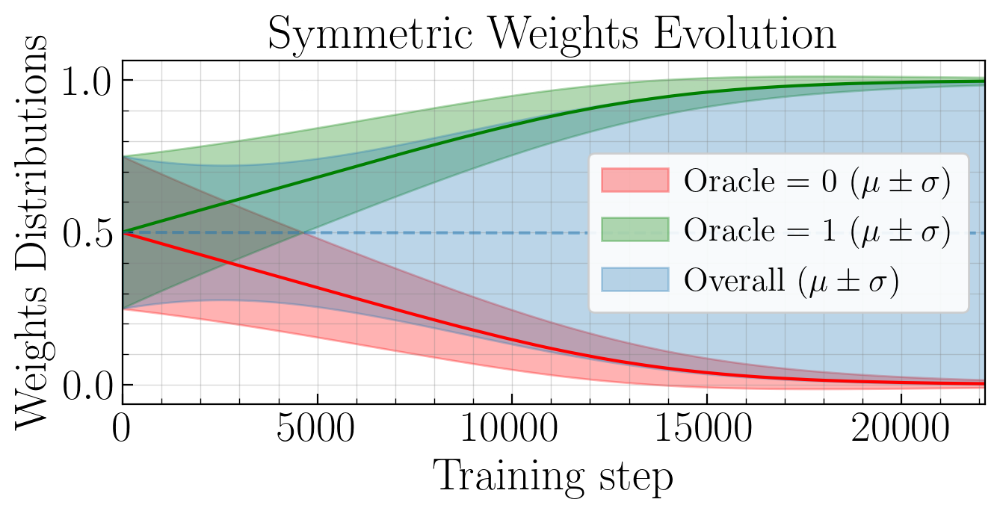

In [3]:
fig, ax = plt.subplots(figsize=(plt.rcParams['figure.figsize'][0],
                                plt.rcParams['figure.figsize'][1] * 0.75))

ax.plot(steps, w_mean_oracle0, color='red')
ax.plot(steps, w_mean_oracle1, color='green')
ax.plot(steps, w_mean_overall, color='C0', linestyle='--', alpha=0.5)

ax.fill_between(steps, w_mean_oracle0 - w_std_oracle0, w_mean_oracle0 + w_std_oracle0, alpha=0.3, label='Oracle = 0 ($\mu \pm \sigma$)', color='red')
ax.fill_between(steps, w_mean_oracle1 - w_std_oracle1, w_mean_oracle1 + w_std_oracle1, alpha=0.3, label='Oracle = 1 ($\mu \pm \sigma$)', color='green')
ax.fill_between(steps, w_mean_overall - w_std_overall, w_mean_overall + w_std_overall, alpha=0.3, label='Overall ($\mu \pm \sigma$)', color='C0')

ax.set_xlabel('Training step')
ax.set_ylabel('Weights Distributions')
ax.set_title('Symmetric Weights Evolution')
ax.set_xlim(0, steps[-1])
ax.legend(loc='center right')

plt.tight_layout()
plt.show()


## Q–Q Plots for Normality Assessment (fixed $p_w = 0.5$)

Quantile–quantile plots comparing the empirical weight distribution at each training snapshot to a normal distribution. The $R^2$ coefficient measures goodness-of-fit, supporting the Gaussian preservation property of Section 4.2.

See Paper Section 5.2.1 Figure 2.

Found 8 weight snapshots
Steps (sorted): [0, 3163, 6326, 9490, 12653, 15817, 18980, 22144]


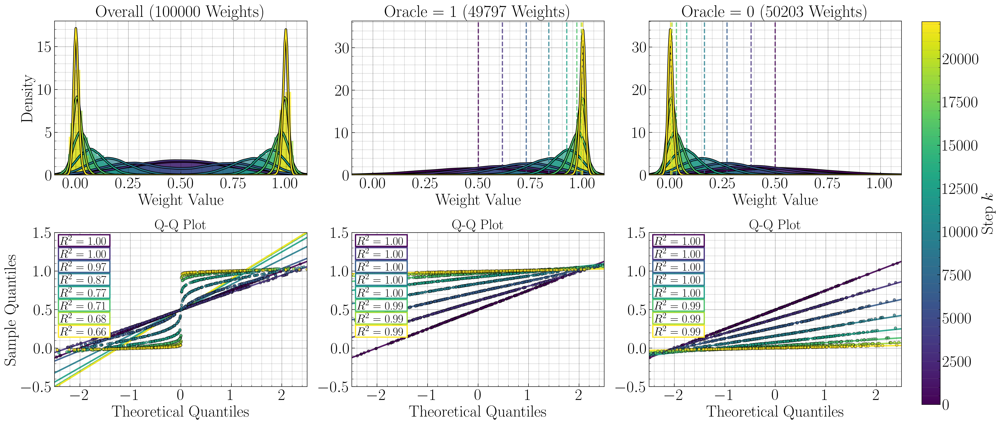

In [4]:
snapshot_files = sorted(glob.glob(f'{results_dir}/p_w_{p_w:.2f}/weights_step_*.npy'))
print(f"Found {len(snapshot_files)} weight snapshots")

snapshot_steps = sorted([int(f.split('_step_')[-1].split('.npy')[0]) for f in snapshot_files])
print(f"Steps (sorted): {snapshot_steps}")

snapshots = []
for step in snapshot_steps:
    weights = np.load(f'{results_dir}/p_w_{p_w:.2f}/weights_step_{step}.npy')
    snapshots.append({
        'step': step,
        'weights': weights,
        'weights_oracle1': weights[oracle_weights == 1],
        'weights_oracle0': weights[oracle_weights == 0]
    })

fig, axes = plot_distribution_analysis(snapshots, n_oracle_0, n_oracle_1, text_ratio=1.2)    
plt.show()

## Analysis Across Different $p_w$ Values

Comparing weight distributions for different initial proportions of oracle weights equal to 1 denoted by the parameter $p_w$.

In [5]:
# Load all p_w results
p_w_values = [0.0, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]

# Find all p_w subdirectories in the latest study folder
p_w_dirs = [f'{results_dir}/p_w_{p_w:.2f}' for p_w in p_w_values]

# Load data for each p_w
all_data = {}
for p_w in p_w_values:
    p_w_dir = f'{results_dir}p_w_{p_w:.2f}'
    if os.path.exists(p_w_dir):
        weight_stats = np.load(f'{p_w_dir}/weight_stats.npy', allow_pickle=True).item()
        oracle_weights = np.load(f'{p_w_dir}/oracle_weights.npy')
        
        all_data[p_w] = {
            'weight_stats': weight_stats,
            'oracle_weights': oracle_weights,
            'steps': weight_stats['steps'],
            'n_oracle_1': np.sum(oracle_weights == 1),
            'n_oracle_0': np.sum(oracle_weights == 0)
        }
        print(f"p_w={p_w:.2f}: {all_data[p_w]['n_oracle_1']} oracle=1, {all_data[p_w]['n_oracle_0']} oracle=0")
    else:
        print(f"Warning: Directory {p_w_dir} not found")

print(f"\nLoaded data for {len(all_data)} p_w values")

p_w=0.00: 0 oracle=1, 100000 oracle=0
p_w=0.10: 9940 oracle=1, 90060 oracle=0
p_w=0.25: 24783 oracle=1, 75217 oracle=0
p_w=0.50: 49797 oracle=1, 50203 oracle=0
p_w=0.75: 74967 oracle=1, 25033 oracle=0
p_w=0.90: 89963 oracle=1, 10037 oracle=0
p_w=1.00: 100000 oracle=1, 0 oracle=0

Loaded data for 7 p_w values


## Weight Evolution Comparison Across $p_w$ Values

Mean and standard deviation of weights for each oracle class, plotted over training steps for all $p_w$ values. Colour encodes $p_w$; solid lines correspond to oracle = 1, dashed lines to oracle = 0. This demonstrate that the $p_w$ value has no influence on convergence dynamics as predicted by the theory.

See Appendix G.1 Figure 14.

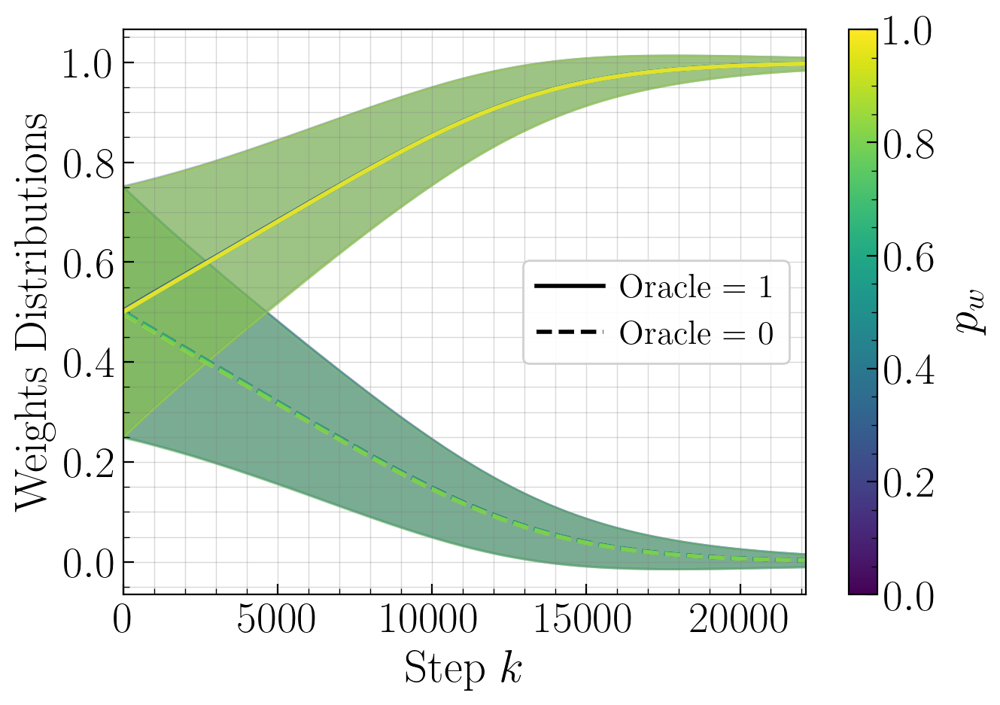

In [6]:
fig, ax = plt.subplots()

final_separations = []
p_w_list = []
p_w_plot_lim = (0.0, 1.0)

colors = plt.cm.viridis(np.linspace(0, 1, len(all_data)))

for i, (p_w, data) in enumerate(sorted(all_data.items())):
    ws = data['weight_stats']
    p_w_steps = ws['steps']

    w_mean_o1 = None
    w_mean_o0 = None
    if p_w_plot_lim[0] <= p_w <= p_w_plot_lim[1]:
        if data['n_oracle_1'] > 0:
            w_mean_o1 = ws['weights_associated_to_oracle_1']['w_mean']
            w_std_o1  = ws['weights_associated_to_oracle_1']['w_std']
            ax.plot(p_w_steps, w_mean_o1, color=colors[i], linewidth=2, linestyle='-', alpha=0.8)
            ax.fill_between(p_w_steps, w_mean_o1 - w_std_o1, w_mean_o1 + w_std_o1, alpha=0.2, color=colors[i])

        if data['n_oracle_0'] > 0:
            w_mean_o0 = ws['weights_associated_to_oracle_0']['w_mean']
            w_std_o0  = ws['weights_associated_to_oracle_0']['w_std']
            ax.plot(p_w_steps, w_mean_o0, color=colors[i], linewidth=2, linestyle='--', alpha=0.8)
            ax.fill_between(p_w_steps, w_mean_o0 - w_std_o0, w_mean_o0 + w_std_o0, alpha=0.2, color=colors[i])

        if w_mean_o1 is not None and w_mean_o0 is not None:
            final_separations.append(w_mean_o1[-1] - w_mean_o0[-1])
            p_w_list.append(p_w)

legend_elements = [
    Line2D([0], [0], color='black', linewidth=2, linestyle='-',  label='Oracle = 1'),
    Line2D([0], [0], color='black', linewidth=2, linestyle='--', label='Oracle = 0')
]
ax.legend(handles=legend_elements)

ax.set_xlabel('Step $k$')
ax.set_ylabel('Weights Distributions')
ax.set_xlim(0, steps[-1])

sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis,
                           norm=plt.Normalize(vmin=min(all_data.keys()), vmax=max(all_data.keys())))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('$p_w$')

plt.tight_layout()
plt.show()


## Q–Q Plots for Final Distributions Across $p_w$ Values

Normality assessment of the final weight distributions for each $p_w$ value, using Q–Q plots with $R^2$ goodness-of-fit. Verifies that the Gaussian approximation holds robustly across different initial class imbalances.

See Paper Appendix G.2 Figures 15-21.

  return n / db / n.sum(), bin_edges
  return _methods._mean(a, axis=axis, dtype=dtype,
  ret = ret.dtype.type(ret / rcount)


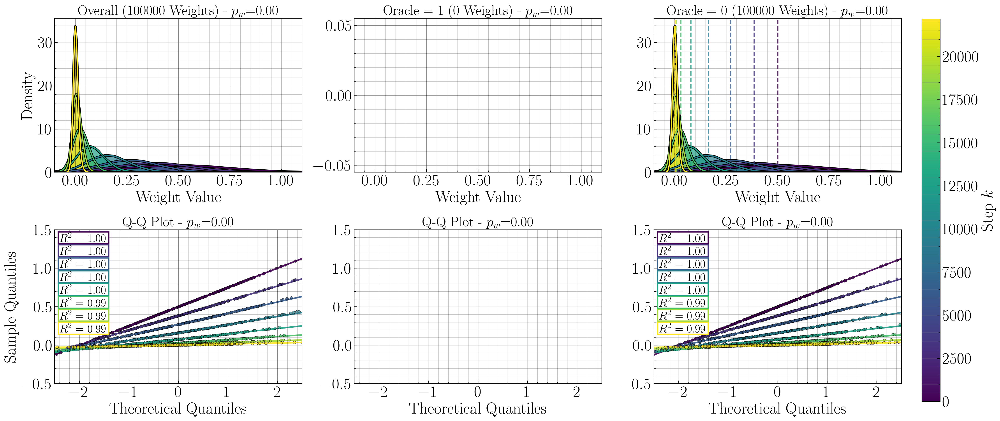

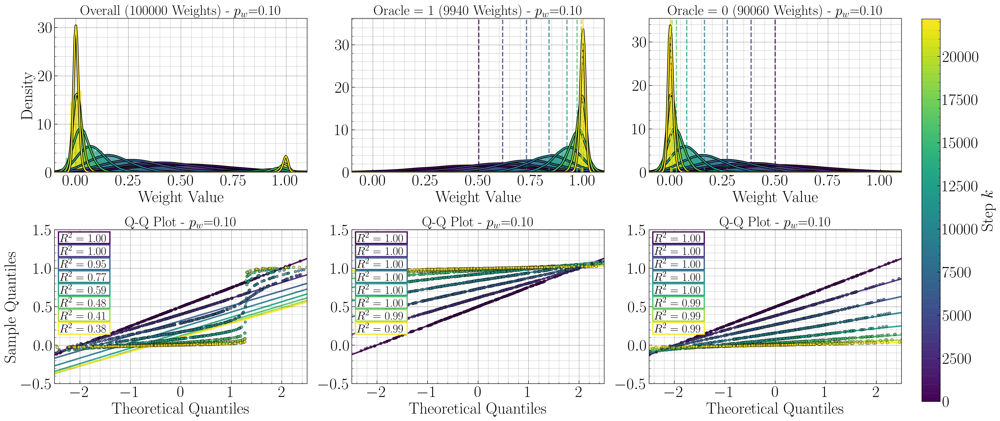

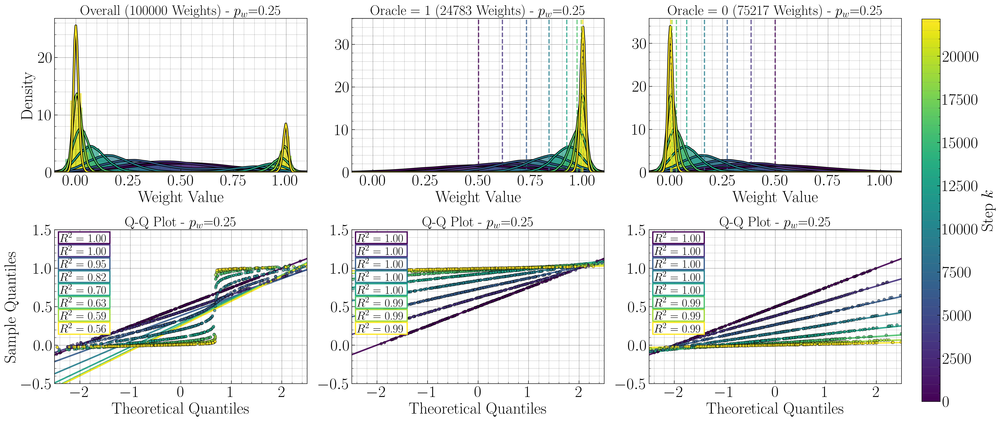

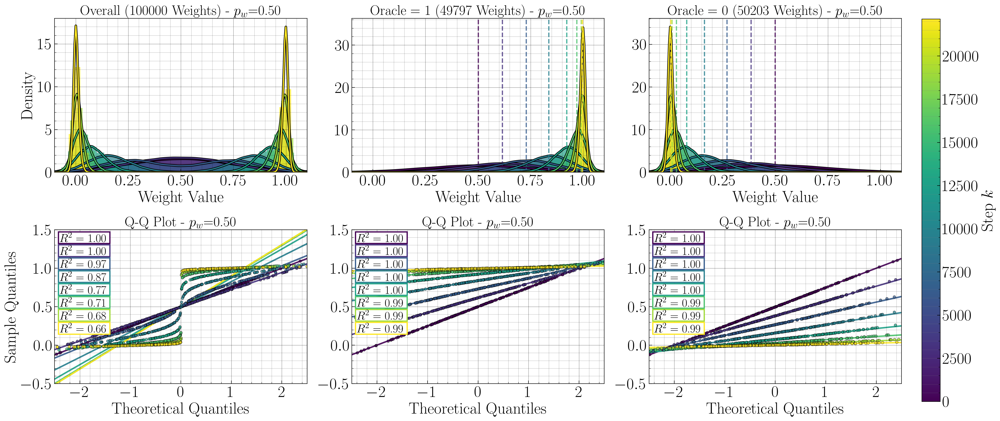

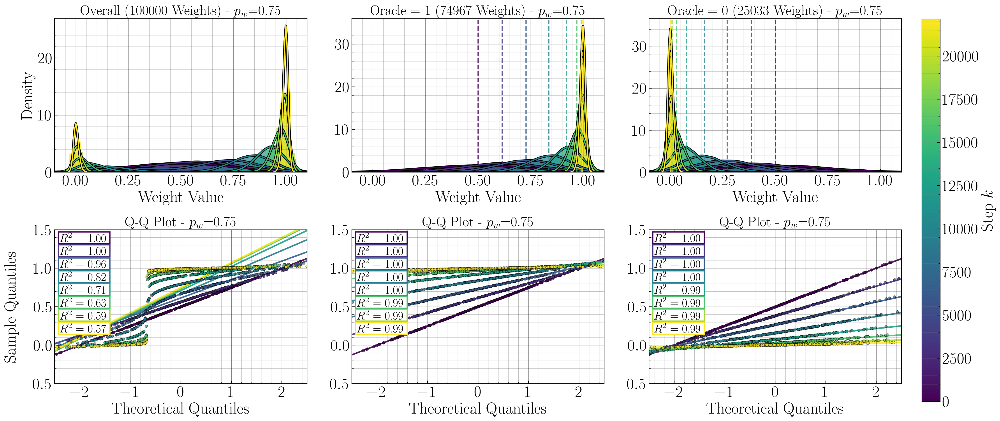

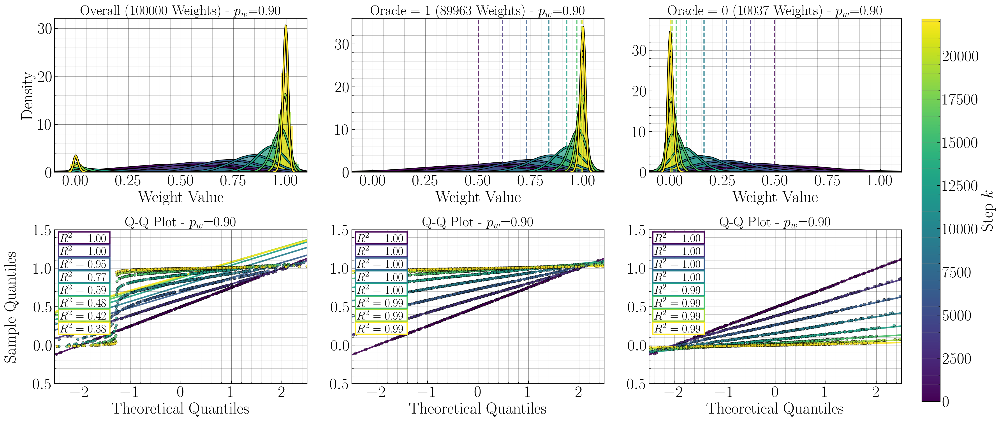

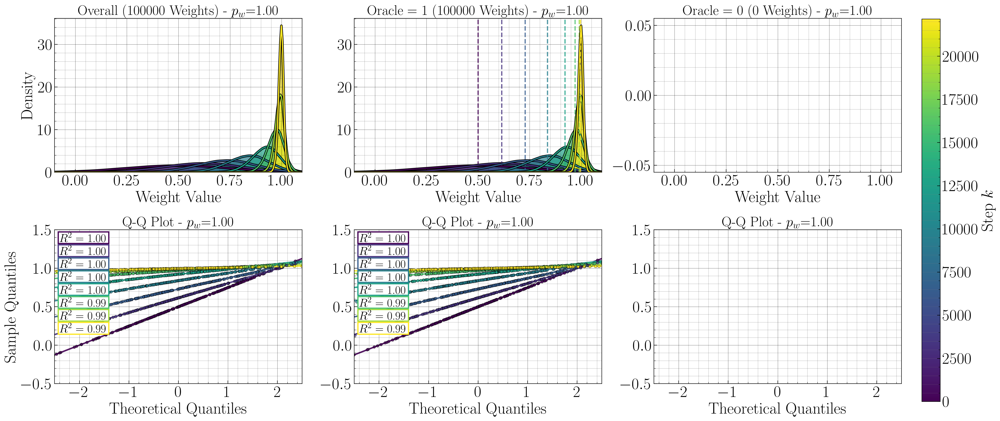

In [8]:
def load_snapshots_for_pw(p_w, data, results_dir):
    """Load all snapshots for a given p_w value."""
    p_w_dir = f'{results_dir}/p_w_{p_w:.2f}'
    snapshot_files = sorted(glob.glob(f'{p_w_dir}/weights_step_*.npy'))
    snapshot_steps = sorted([int(f.split('_step_')[-1].split('.npy')[0]) for f in snapshot_files])
    oracle_weights = data['oracle_weights']
    snapshots = []
    for step in snapshot_steps:
        weights = np.load(f'{p_w_dir}/weights_step_{step}.npy')
        snapshots.append({
            'step': step,
            'weights': weights,
            'weights_oracle1': weights[oracle_weights == 1] if np.sum(oracle_weights == 1) > 0 else np.array([]),
            'weights_oracle0': weights[oracle_weights == 0] if np.sum(oracle_weights == 0) > 0 else np.array([])
        })
    return snapshots

p_w_values = sorted(all_data.keys())
n_p_w = len(p_w_values)

for p_w_idx, (p_w, data) in enumerate(sorted(all_data.items())):
    snapshots = load_snapshots_for_pw(p_w, data, results_dir)

    snapshot_steps = [snapshot['step'] for snapshot in snapshots]

    n_oracle_1 = len(snapshots[0]['weights_oracle1']) if len(snapshots) > 0 and len(snapshots[0]['weights_oracle1']) > 0 else 0
    n_oracle_0 = len(snapshots[0]['weights_oracle0']) if len(snapshots) > 0 and len(snapshots[0]['weights_oracle0']) > 0 else 0

    fig, axes = plot_distribution_analysis(snapshots, n_oracle_0, n_oracle_1, text_ratio=1.2)    
    for ax in axes.flatten():
        ax_title = ax.get_title()
        ax.set_title(f'{ax_title} - $p_w$={p_w:.2f}')
    plt.show()
